In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/ieee-fraud-detection/sample_submission.csv
/kaggle/input/ieee-fraud-detection/test_identity.csv
/kaggle/input/ieee-fraud-detection/train_identity.csv
/kaggle/input/ieee-fraud-detection/test_transaction.csv
/kaggle/input/ieee-fraud-detection/train_transaction.csv


# Libraries

In [2]:
# Plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

# scikit-learn is a rich ML library
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.feature_extraction.text import TfidfVectorizer

# library of XGBoost algorithm. You can find one in scikit-learn, too.
import xgboost as xgb

# library for regex
import re

# library for garbage collection
import gc
gc.enable()

# Let's ignore the warnings
import warnings
warnings.filterwarnings('ignore')

# Load Data

In [3]:
%%time
# TransactionID is the key column. We define it as the index column for ease of use.
tr_identity = pd.read_csv('/kaggle/input/ieee-fraud-detection/train_identity.csv', index_col='TransactionID')
ts_identity = pd.read_csv('/kaggle/input/ieee-fraud-detection/test_identity.csv', index_col='TransactionID')
tr_transaction = pd.read_csv('/kaggle/input/ieee-fraud-detection/train_transaction.csv', index_col='TransactionID')
ts_transaction = pd.read_csv('/kaggle/input/ieee-fraud-detection/test_transaction.csv', index_col='TransactionID')
print("Data Loaded!")

Data Loaded!
CPU times: user 49.9 s, sys: 6.29 s, total: 56.2 s
Wall time: 1min 19s


In [4]:
# Let's see the size of the tables
print("train transaction shape:", tr_transaction.shape)
print("test transaction shape:", ts_transaction.shape)
print("train identity shape:", tr_identity.shape)
print("test identity shape:", ts_identity.shape)

train transaction shape: (590540, 393)
test transaction shape: (506691, 392)
train identity shape: (144233, 40)
test identity shape: (141907, 40)


# Explore Data

<AxesSubplot:xlabel='isFraud', ylabel='count'>

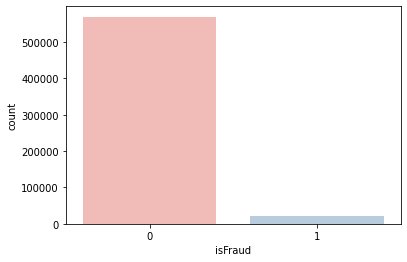

In [5]:
# How is the data distributed among the classes?
sns.countplot(tr_transaction['isFraud'], palette='Pastel1')

In [6]:
# What portion of data in transaction table is missing?
missing_values_count = tr_transaction.isnull().sum()
print (missing_values_count)
total_cells = np.product(tr_transaction.shape)
total_missing = missing_values_count.sum()
print (f'{round((total_missing/total_cells) * 100, 2)}% of transaction data is missing!')

isFraud                0
TransactionDT          0
TransactionAmt         0
ProductCD              0
card1                  0
                   ...  
V335              508189
V336              508189
V337              508189
V338              508189
V339              508189
Length: 393, dtype: int64
41.18% of transaction data is missing!


In [7]:
# What portion of data in identity table is missing?
missing_values_count = tr_identity.isnull().sum()
print (missing_values_count)
total_cells = np.product(tr_identity.shape)
total_missing = missing_values_count.sum()
print (f'{round((total_missing/total_cells) * 100, 2)}% of identity data is missing!')

id_01              0
id_02           3361
id_03          77909
id_04          77909
id_05           7368
id_06           7368
id_07         139078
id_08         139078
id_09          69307
id_10          69307
id_11           3255
id_12              0
id_13          16913
id_14          64189
id_15           3248
id_16          14893
id_17           4864
id_18          99120
id_19           4915
id_20           4972
id_21         139074
id_22         139064
id_23         139064
id_24         139486
id_25         139101
id_26         139070
id_27         139064
id_28           3255
id_29           3255
id_30          66668
id_31           3951
id_32          66647
id_33          70944
id_34          66428
id_35           3248
id_36           3248
id_37           3248
id_38           3248
DeviceType      3423
DeviceInfo     25567
dtype: int64
36.47% of identity data is missing!


In [8]:
# What portion of transactions have an identity record?
print(f'{round(np.sum(tr_transaction.index.isin(tr_identity.index.unique())) / len(tr_transaction) *100, 2)}% of transactions have identity.')

24.42% of transactions have identity.


In [9]:
# What is the distribution of transaction's date-time?
fig = px.histogram(tr_transaction, x='TransactionDT', color='isFraud', marginal='box')
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.6)
fig.show()

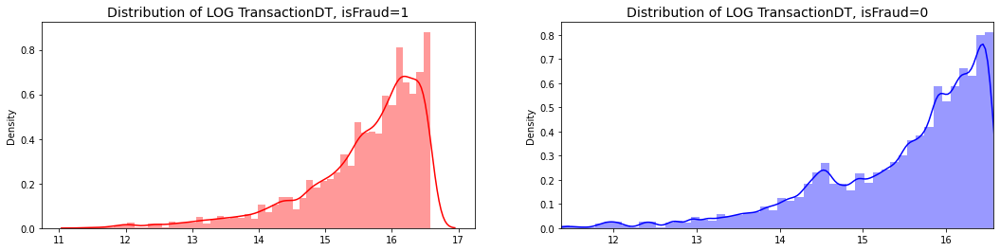

In [10]:
# Let's plot it in logarithm scale for a better insight
fig, ax = plt.subplots(1, 2, figsize=(18,4))

time_val = tr_transaction.loc[tr_transaction['isFraud'] == 1]['TransactionDT'].values

sns.distplot(np.log(time_val), ax=ax[0], color='r')
ax[0].set_title('Distribution of LOG TransactionDT, isFraud=1', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])

time_val = tr_transaction.loc[tr_transaction['isFraud'] == 0]['TransactionDT'].values

sns.distplot(np.log(time_val), ax=ax[1], color='b')
ax[1].set_title('Distribution of LOG TransactionDT, isFraud=0', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])


plt.show()

Text(0.5, 1.0, 'Histogram of transaction datetime')

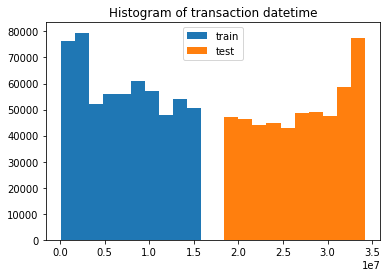

In [11]:
# Do the date-times of transactions in train and test overlap?
plt.hist(tr_transaction['TransactionDT'], label='train')
plt.hist(ts_transaction['TransactionDT'], label='test')
plt.legend()
plt.title("Histogram of transaction datetime")

In [12]:
# What is the distribution of transactions' amount?
fig = px.histogram(tr_transaction, x='TransactionAmt', color='isFraud', marginal='box')
fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.6)
fig.show()

In [13]:
gc.collect()

709

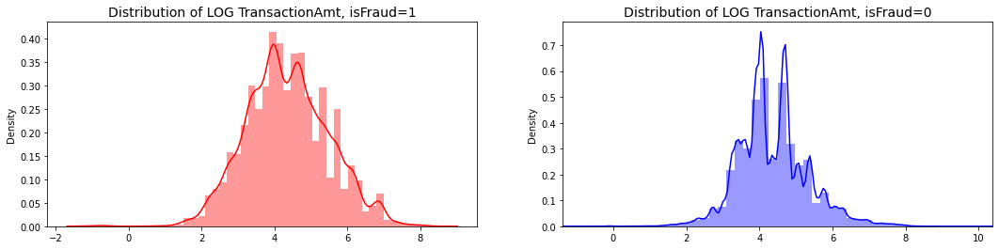

In [14]:
# Let's plot in logarithm scale for a better insight
fig, ax = plt.subplots(1, 2, figsize=(18,4))

time_val = tr_transaction.loc[tr_transaction['isFraud'] == 1]['TransactionAmt'].values

sns.distplot(np.log(time_val), ax=ax[0], color='r')
ax[0].set_title('Distribution of LOG TransactionAmt, isFraud=1', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])

time_val = tr_transaction.loc[tr_transaction['isFraud'] == 0]['TransactionAmt'].values

sns.distplot(np.log(time_val), ax=ax[1], color='b')
ax[1].set_title('Distribution of LOG TransactionAmt, isFraud=0', fontsize=14)
ax[1].set_xlim([min(np.log(time_val)), max(np.log(time_val))])


plt.show()

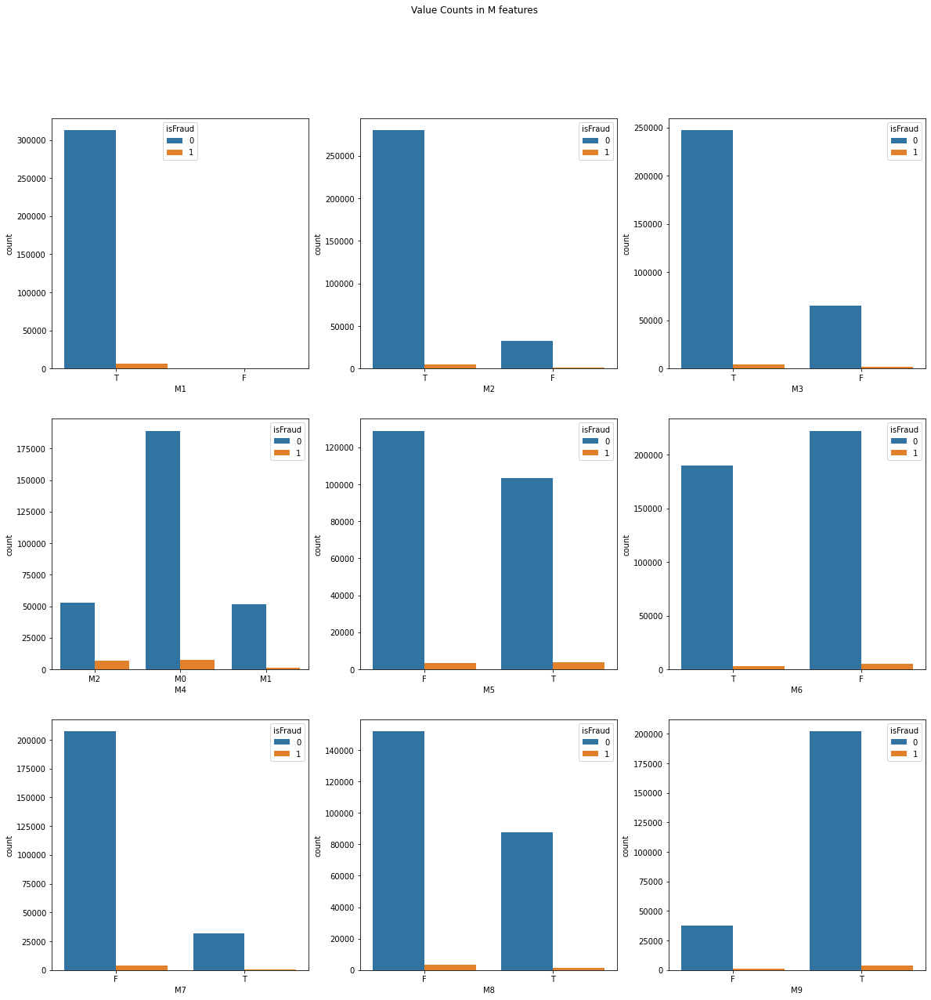

In [15]:
# M is a categorical feature. Let's explore it.
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
fig.suptitle("Value Counts in M features")
for i in range(3):
    for j in range(3):
        sns.countplot(data=tr_transaction, x=f'M{3*i+j+1}', hue='isFraud', ax=axes[i,j])

<AxesSubplot:xlabel='ProductCD', ylabel='count'>

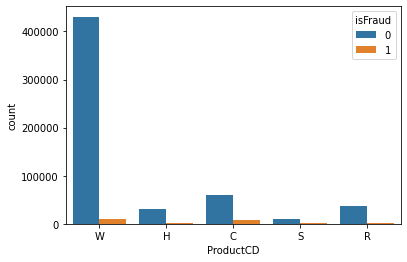

In [16]:
# ProductCD is a categorical feature
sns.countplot(data=tr_transaction, x="ProductCD", hue='isFraud')

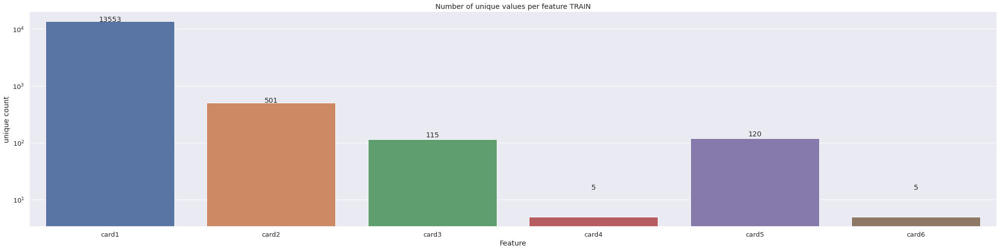

In [17]:
# How many unique values are there in each card feature in the train set?
plt.figure(figsize=(35, 8))
features = [f'card{i}' for i in range(1, 7)]
uniques = [len(tr_transaction[col].unique()) for col in features]
sns.set(font_scale=1.2)
ax = sns.barplot(features, uniques, log=True)
ax.set(xlabel='Feature', ylabel='unique count', title='Number of unique values per feature TRAIN')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center")

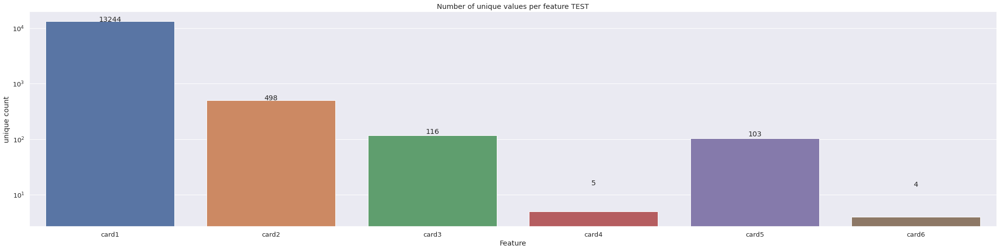

In [18]:
# How many unique values are there in each card feature in the test set?
plt.figure(figsize=(35, 8))
features = [f'card{i}' for i in range(1, 7)]
uniques = [len(ts_transaction[col].unique()) for col in features]
sns.set(font_scale=1.2)
ax = sns.barplot(features, uniques, log=True)
ax.set(xlabel='Feature', ylabel='unique count', title='Number of unique values per feature TEST')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center")

<AxesSubplot:xlabel='card4', ylabel='count'>

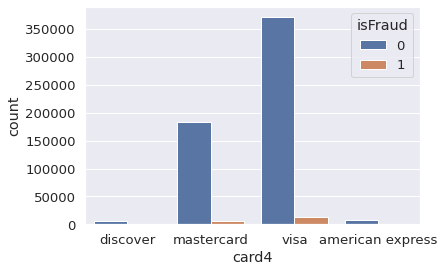

In [19]:
# Visualizing card4 categories
sns.countplot(data=tr_transaction, x='card4', hue='isFraud')

<AxesSubplot:xlabel='card6', ylabel='count'>

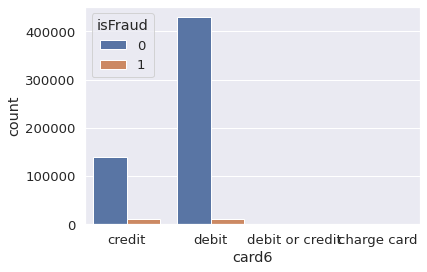

In [20]:
# Visualizing card6 categories
sns.countplot(data=tr_transaction, x='card6', hue='isFraud')

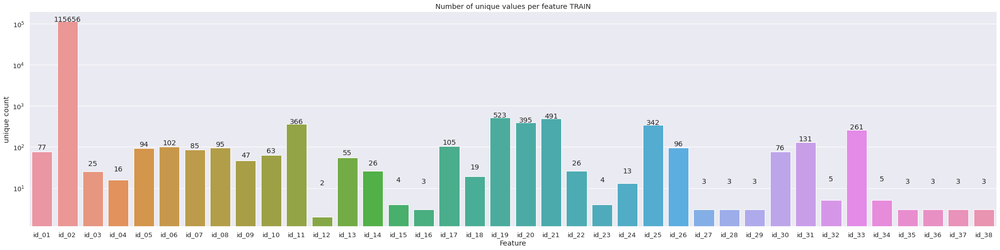

In [21]:
# How many unique values are there in id features in the train set?
plt.figure(figsize=(35, 8))
features = list(tr_identity.columns[0:38])
uniques = [len(tr_identity[col].unique()) for col in features]
sns.set(font_scale=1.2)
ax = sns.barplot(features, uniques, log=True)
ax.set(xlabel='Feature', ylabel='unique count', title='Number of unique values per feature TRAIN')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center")

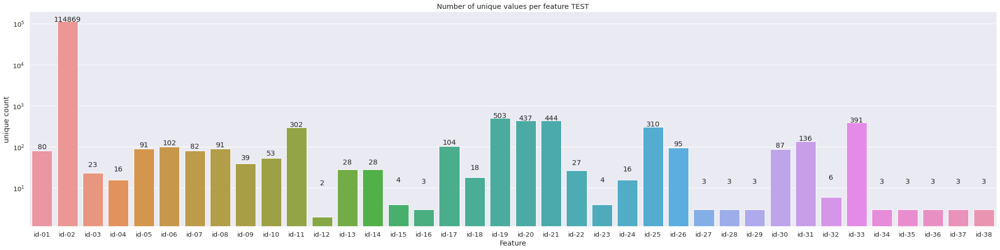

In [22]:
# How many unique values are there in id features in the test set?
plt.figure(figsize=(35, 8))
features = list(ts_identity.columns[0:38])
uniques = [len(ts_identity[col].unique()) for col in features]
sns.set(font_scale=1.2)
ax = sns.barplot(features, uniques, log=True)
ax.set(xlabel='Feature', ylabel='unique count', title='Number of unique values per feature TEST')
for p, uniq in zip(ax.patches, uniques):
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 10,
            uniq,
            ha="center") 

In [23]:
tr_identity.head()

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [24]:
# Are there categories that exist in the test set but not in the train?
for ft in features[11:]:
    print("Feature:", ft)
    print(set(ts_identity[ft].unique()).difference(set(tr_identity[ft.replace('-', '_')].unique())))
    print("*"*40)

Feature: id-12
set()
****************************************
Feature: id-13
{nan, 16.0}
****************************************
Feature: id-14
{nan, -720.0, 660.0, 570.0}
****************************************
Feature: id-15
set()
****************************************
Feature: id-16
set()
****************************************
Feature: id-17
{nan, 165.0, 167.0, 169.0, 170.0, 172.0, 174.0, 176.0, 179.0, 181.0, 187.0, 193.0, 196.0, 209.0, 215.0, 222.0, 223.0, 224.0, 227.0, 103.0, 104.0, 108.0, 113.0, 115.0}
****************************************
Feature: id-18
{nan, 19.0}
****************************************
Feature: id-19
{nan, 513.0, 518.0, 392.0, 143.0, 656.0, 408.0, 540.0, 285.0, 286.0, 159.0, 293.0, 423.0, 169.0, 172.0, 181.0, 568.0, 448.0, 450.0, 323.0, 580.0, 198.0, 329.0, 331.0, 206.0, 334.0, 336.0, 464.0, 338.0, 465.0, 594.0, 596.0, 470.0, 217.0, 354.0, 227.0, 486.0, 111.0, 624.0, 497.0, 115.0, 501.0, 629.0, 504.0, 637.0, 126.0, 255.0}
****************************

Let's take a look at unique values in some other categorical features

In [25]:
tr_transaction['P_emaildomain'].unique()

array([nan, 'gmail.com', 'outlook.com', 'yahoo.com', 'mail.com',
       'anonymous.com', 'hotmail.com', 'verizon.net', 'aol.com', 'me.com',
       'comcast.net', 'optonline.net', 'cox.net', 'charter.net',
       'rocketmail.com', 'prodigy.net.mx', 'embarqmail.com', 'icloud.com',
       'live.com.mx', 'gmail', 'live.com', 'att.net', 'juno.com',
       'ymail.com', 'sbcglobal.net', 'bellsouth.net', 'msn.com', 'q.com',
       'yahoo.com.mx', 'centurylink.net', 'servicios-ta.com',
       'earthlink.net', 'hotmail.es', 'cfl.rr.com', 'roadrunner.com',
       'netzero.net', 'gmx.de', 'suddenlink.net', 'frontiernet.net',
       'windstream.net', 'frontier.com', 'outlook.es', 'mac.com',
       'netzero.com', 'aim.com', 'web.de', 'twc.com', 'cableone.net',
       'yahoo.fr', 'yahoo.de', 'yahoo.es', 'sc.rr.com', 'ptd.net',
       'live.fr', 'yahoo.co.uk', 'hotmail.fr', 'hotmail.de',
       'hotmail.co.uk', 'protonmail.com', 'yahoo.co.jp'], dtype=object)

In [26]:
tr_transaction['R_emaildomain'].unique()

array([nan, 'gmail.com', 'hotmail.com', 'outlook.com', 'anonymous.com',
       'charter.net', 'prodigy.net.mx', 'comcast.net', 'live.com.mx',
       'icloud.com', 'yahoo.com', 'aol.com', 'juno.com', 'att.net',
       'verizon.net', 'yahoo.com.mx', 'bellsouth.net', 'servicios-ta.com',
       'ymail.com', 'hotmail.es', 'msn.com', 'optonline.net', 'live.com',
       'gmx.de', 'aim.com', 'mail.com', 'me.com', 'outlook.es', 'cox.net',
       'earthlink.net', 'embarqmail.com', 'web.de', 'sbcglobal.net',
       'scranton.edu', 'mac.com', 'twc.com', 'roadrunner.com', 'yahoo.fr',
       'yahoo.de', 'yahoo.es', 'frontiernet.net', 'gmail', 'live.fr',
       'q.com', 'yahoo.co.uk', 'windstream.net', 'suddenlink.net',
       'hotmail.fr', 'ptd.net', 'hotmail.de', 'frontier.com',
       'cfl.rr.com', 'hotmail.co.uk', 'netzero.com', 'netzero.net',
       'yahoo.co.jp', 'rocketmail.com', 'centurylink.net',
       'protonmail.com', 'cableone.net', 'sc.rr.com'], dtype=object)

In [27]:
tr_transaction['addr1'].unique()

array([315., 325., 330., 476., 420., 272., 126., 337., 204.,  nan, 226.,
       170., 184., 264., 299., 441., 472., 251., 469., 191., 485., 122.,
       220., 205., 387., 181., 231., 436., 327., 343., 123., 502., 269.,
       158., 433., 143., 225., 492., 177., 512., 310., 308., 418., 494.,
       253., 428., 203., 110., 444., 498., 194., 536., 384., 324., 295.,
       448., 157., 171., 224., 491., 274., 432., 459., 106., 296., 254.,
       452., 347., 335., 305., 161., 221., 154., 130., 465., 451., 331.,
       511., 486., 312., 242., 131., 508., 332., 283., 216., 431., 391.,
       333., 496., 304., 167., 261., 399., 164., 142., 393., 258., 375.,
       483., 404., 482., 148., 218., 127., 403., 374., 477., 478., 241.,
       504., 453., 535., 100., 239., 152., 500., 356., 198., 162., 244.,
       520., 531., 401., 427., 352., 540., 456., 371., 409., 529., 505.,
       503., 346., 359., 499., 298., 190., 454., 172., 145., 493., 119.,
       521., 270., 395., 366., 348., 313., 338., 13

In [28]:
tr_transaction['addr2'].unique()

array([ 87.,  nan,  96.,  35.,  60.,  98.,  43.,  65.,  32.,  13.,  31.,
       101.,  24.,  16.,  15.,  19.,  71.,  59., 102.,  44.,  26.,  69.,
        47.,  78.,  88.,  66.,  72.,  22.,  57.,  25.,  17.,  30.,  29.,
        21.,  14.,  49.,  83.,  75.,  34.,  86.,  48.,  68.,  23.,  70.,
        62.,  54.,  50.,  52.,  39.,  76.,  10.,  73.,  97.,  63.,  27.,
        28.,  38.,  74.,  77.,  92.,  79.,  84.,  82.,  40.,  36.,  46.,
        18.,  20.,  89.,  61.,  94., 100.,  55.,  51.,  93.])

<AxesSubplot:xlabel='DeviceType', ylabel='count'>

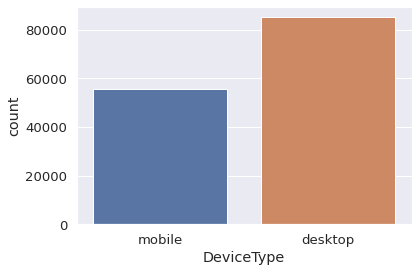

In [29]:
# Visualizing DeviceType feature
sns.countplot(data=tr_identity, x='DeviceType')

In [30]:
tr_identity['DeviceInfo'].unique()

array(['SAMSUNG SM-G892A Build/NRD90M', 'iOS Device', 'Windows', ...,
       'LDN-LX3 Build/HUAWEILDN-LX3', 'Z955A', 'LG-E975'], dtype=object)

# Feature Engineering

In [31]:
# id features are not named unifyingly in the train and test and should be fixed.
ts_identity.rename(columns={x: x.replace('-', '_') for x in ts_identity.columns[:38]}, inplace=True)

In [32]:
# From kernel https://www.kaggle.com/gemartin/load-data-reduce-memory-usage
# WARNING! THIS CAN DAMAGE THE DATA 
def reduce_mem_usage_numeric(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df


def reduce_mem_usage_cat(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type == object and col not in ['DeviceInfo', 'id_30', 'id_31']:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [33]:
# Function to drop some columns
def columns2drop(df):
    drop_list = ['id_33', 'P_emaildomain', 'R_emaildomain', 'TransactionDT']
    for col in df.columns:
        if df[col].isnull().sum() / df.shape[0] > 0.9:
            drop_list.append(col)
    return drop_list

In [34]:
# Function to split the email domains into separate columns
def split_email_domains(df):
    df[['P_emaildomain1', 'P_emaildomain2', 'P_emaildomain3']] = df['P_emaildomain'].str.split('.', expand=True)
    df[['R_emaildomain1', 'R_emaildomain2', 'R_emaildomain3']] = df['R_emaildomain'].str.split('.', expand=True)
    for x in ['R', 'P']:
        for i in range(1, 4):
            df[f'{x}_emaildomain{i}'].fillna('', inplace=True)

In [35]:
# Function to generate a numerical column from id_33 which apparently contains string of dimensions
def split_id33(df):
    name = "id-33"
    if not 'id-33' in df.columns:
        name = "id_33"
    df[["height", "width"]] = df[name].str.split('x', expand=True)
    df['height'].fillna(0, inplace=True)
    df['width'].fillna(-1, inplace=True)
    df['aspect_ratio'] = df['height'].astype('uint16') / df['width'].astype('uint16')
    df.drop(['height', 'width'], axis=1, inplace=True)

In [36]:
# function to apply the preprocessing
def preprocessing(df, drop_list):
    split_id33(df)
    split_email_domains(df)
    
    df['Transaction_day_of_week'] = np.floor((df['TransactionDT'] / (3600 * 24) - 1) % 7)
    df['Transaction_hour'] = np.floor(df['TransactionDT'] / 3600) % 24
    
    df.drop(drop_list, axis=1, inplace=True)

In [37]:
# Functions to handle tfidf vectorization
def tokenizer(x):
    return re.split(' ._-/', x)


def tfidf_vectorizer(train_df, test_df, col):
    train_df[col].fillna('Unknown', inplace=True)
    test_df[col].fillna('Unknown', inplace=True)

    tfidf = TfidfVectorizer(decode_error='replace', lowercase=True, strip_accents='ascii', analyzer='char_wb', tokenizer=tokenizer)
    v = tfidf.fit_transform(train_df[col])
    w = tfidf.transform(test_df[col])
    
    tr_tfidf = pd.DataFrame.sparse.from_spmatrix(v, index=train_df.index, columns=[f'{col}_{i}' for i in tfidf.vocabulary_])
    ts_tfidf = pd.DataFrame.sparse.from_spmatrix(w, index=test_df.index, columns=[f'{col}_{i}' for i in tfidf.vocabulary_])
    
    for col in tr_tfidf.columns:
        tr_tfidf[col] = tr_tfidf[col].values.to_dense().astype(np.float16)
        ts_tfidf[col] = ts_tfidf[col].values.to_dense().astype(np.float16)

    tr = pd.concat([train_df, tr_tfidf], axis=1)
    del tr_tfidf, train_df
    ts = pd.concat([test_df, ts_tfidf], axis=1)
    del ts_tfidf, test_df
    
    gc.collect()
    
    return tr, ts

In [38]:
# Join the two tables
train = tr_transaction.merge(tr_identity, how='left', left_index=True, right_index=True)
y_train = train['isFraud'].astype('uint8').copy()
del tr_transaction, tr_identity

test = ts_transaction.merge(ts_identity, how='left', left_index=True, right_index=True)
del ts_transaction, ts_identity

print(f"Shape of train data: {train.shape}, Shape of test data: {test.shape}")

train.head()

Shape of train data: (590540, 433), Shape of test data: (506691, 432)


,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
TransactionID,,,,,,,,,,,,,,,,,,,,,
2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M


In [39]:
gc.collect()

21168

In [40]:
X_train = train.drop('isFraud', axis=1)
del train
gc.collect()

21

In [41]:
drop_list = columns2drop(X_train)
preprocessing(X_train, drop_list)

In [42]:
preprocessing(test, drop_list)

In [43]:
X_train = reduce_mem_usage_numeric(X_train)
test = reduce_mem_usage_numeric(test)

Memory usage of dataframe is 1935.45 MB
Memory usage after optimization is: 658.15 MB
Decreased by 66.0%
Memory usage of dataframe is 1662.93 MB
Memory usage after optimization is: 574.73 MB
Decreased by 65.4%


In [44]:
# Encoding labels in categorical features
for f in X_train.columns:
    if f not in ['DeviceInfo', 'id_30', 'id_31'] and (X_train[f].dtype=='object' or test[f].dtype=='object'):
        lbl = LabelEncoder()
        lbl.fit(list(X_train[f].values) + list(test[f].values))
        X_train[f] = lbl.transform(list(X_train[f].values))
        test[f] = lbl.transform(list(test[f].values))

In [45]:
X_train, test = tfidf_vectorizer(X_train, test, 'DeviceInfo')
X_train, test = tfidf_vectorizer(X_train, test, 'id_30')
X_train, test = tfidf_vectorizer(X_train, test, 'id_31')

In [46]:
X_train.drop(['DeviceInfo', 'id_30', 'id_31'], axis=1, inplace=True)
test.drop(['DeviceInfo', 'id_30', 'id_31'], axis=1, inplace=True)

In [47]:
# Now all the features are numerical. Let's fill the missings with -1.
X_train.fillna(-1, inplace=True)
test.fillna(-1, inplace=True)

In [48]:
# Just to ensure no other category is left and if so, reduce its memory
X_train = reduce_mem_usage_cat(X_train)
test = reduce_mem_usage_cat(test)

Memory usage of dataframe is 776.42 MB
Memory usage after optimization is: 776.42 MB
Decreased by 0.0%
Memory usage of dataframe is 676.20 MB
Memory usage after optimization is: 676.20 MB
Decreased by 0.0%


# Build Model and Evaluate

In [49]:
NFOLDS = 5
kf = StratifiedKFold(n_splits=NFOLDS, shuffle=True, random_state=1400)

y_preds = np.zeros(test.shape[0])
y_oof = np.zeros(X_train.shape[0])
score = 0
  
for fold, (tr_idx, val_idx) in enumerate(kf.split(X_train, y_train)):
    clf = xgb.XGBClassifier(  # For more info about the parameters, visit https://xgboost.readthedocs.io/en/latest/parameter.html
        n_estimators=500,
        max_depth=12,
        learning_rate=0.05,
        subsample=0.9,
        colsample_bytree=0.9,
        gamma = 0.2,
        alpha = 5,
        missing=-1,
        tree_method='gpu_hist'
    )
    
    X_tr, X_vl = X_train.iloc[tr_idx, :], X_train.iloc[val_idx, :]
    y_tr, y_vl = y_train.iloc[tr_idx], y_train.iloc[val_idx]
    clf.fit(X_tr, y_tr)
    y_pred_train = clf.predict_proba(X_vl)[:,1]
    y_oof[val_idx] = y_pred_train
    print("FOLD: ",fold,' AUC {}'.format(roc_auc_score(y_vl, y_pred_train)))
    score += roc_auc_score(y_vl, y_pred_train) / NFOLDS
    y_preds += clf.predict_proba(test)[:,1] / NFOLDS
    
    # delete the excess memory
    del X_tr, X_vl, y_tr, y_vl
    gc.collect()
    
    
print("\nMEAN AUC = {}".format(score))
print("OOF AUC = {}".format(roc_auc_score(y_train, y_oof)))  # OOF stands for out-of-fold

[07:10:48] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
FOLD:  0  AUC 0.9662926003392233
[07:12:51] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
FOLD:  1  AUC 0.970022834667525
[07:14:54] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
FOLD:  2  AUC 0.9701085952827426
[07:16:55] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was

<AxesSubplot:>

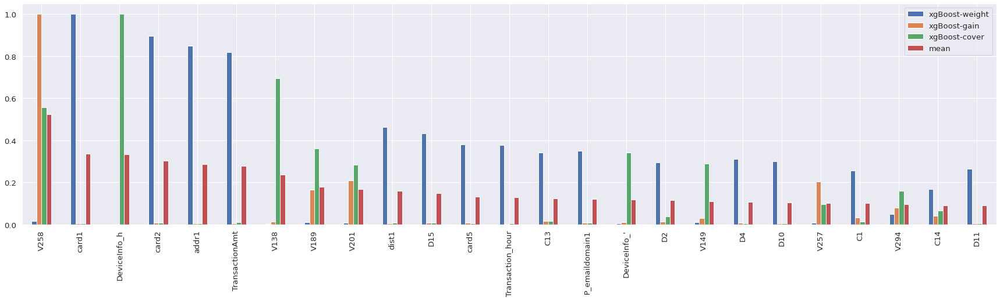

In [50]:
# Get xgBoost importances
importance_dict = {}
for import_type in ['weight', 'gain', 'cover']:
    importance_dict['xgBoost-'+import_type] = clf.get_booster().get_score(importance_type=import_type)
    
# MinMax scale all importances
importance_df = pd.DataFrame(importance_dict).fillna(0)
importance_df = pd.DataFrame(
    MinMaxScaler().fit_transform(importance_df),
    columns=importance_df.columns,
    index=importance_df.index
)

# Create mean column
importance_df['mean'] = importance_df.mean(axis=1)

# Plot the feature importances
importance_df.sort_values('mean', ascending=False).head(25).plot(kind='bar', figsize=(30, 7))

In [51]:
# delete the excess memory
del clf, importance_df
gc.collect()

47

In [52]:
# Prepare for submission
sub = pd.read_csv('/kaggle/input/ieee-fraud-detection/sample_submission.csv', index_col='TransactionID')
sub['isFraud'] = y_preds
sub.to_csv('submission.csv')
sub.head()

,isFraud
TransactionID,
3663549,0.002798
3663550,0.000870
3663551,0.001643
3663552,0.002270
3663553,0.001485


# Resources

[Fraud complete EDA](https://www.kaggle.com/jesucristo/fraud-complete-eda/notebook)

[EDA for CIS Fraud Detection](https://www.kaggle.com/nroman/eda-for-cis-fraud-detection)

[~Almost~ complete Feature Engineering IEEE data](https://www.kaggle.com/kabure/almost-complete-feature-engineering-ieee-data)

[Extensive EDA and Modeling XGB Hyperopt](https://www.kaggle.com/kabure/extensive-eda-and-modeling-xgb-hyperopt)